# Seafloor Bacterial Floc Analysis

This notebook shows an example of doing an analysis of water column "floc" using Pangeo. The goal of this work is to understand changes in the concentration of floc, which is bacterial material that has been flushed from the hydrothermal system into the ocean. Changes in floc are a potential indicator of changes in the hydrothermal system, possibly resulting from a magmatic event or seismic swarm.

In this notebook we analyze a large number of OOI HD video camera frames to establish a proxy for the floc concentration, and then display the results using a two-dimensional multivariate histogram.

## Get a list of CamHD files to process

In [2]:
import pandas as pd

In [3]:
dbcamhd = pd.read_json('dbcamhd.json', orient="records", lines=True)
dbcamhd.tail()

,blob_url,blob_size,timestamp,frame_count,deployment
16542,https://ooiopendata.blob.core.windows.net/camh...,579029643,1564110010,26704,6
16543,https://ooiopendata.blob.core.windows.net/camh...,579615087,1564120809,26731,6
16544,https://ooiopendata.blob.core.windows.net/camh...,579571615,1564131610,26729,6
16545,https://ooiopendata.blob.core.windows.net/camh...,579658391,1564142410,26733,6
16546,https://ooiopendata.blob.core.windows.net/camh...,579007991,1564153210,26703,6


In [4]:
print("Total files: %i" % len(dbcamhd))
print("Total frames: %i" % dbcamhd.frame_count.sum())

Total files: 16547
Total frames: 450267566


In [4]:
blob_urls = list(dbcamhd.blob_url[(dbcamhd.deployment == 2) & (dbcamhd.frame_count > 5000) & (dbcamhd.frame_count < 30000)])
#blob_urls = list(dbcamhd.blob_url[(dbcamhd.frame_count > 5000) & (dbcamhd.frame_count < 30000)])
blob_urls.sort()

In [5]:
len(blob_urls)

1885

In [6]:
blob_urls[0:10]

['https://ooiopendata.blob.core.windows.net/camhd/CAMHDA301-20151119T210000Z.mov',
 'https://ooiopendata.blob.core.windows.net/camhd/CAMHDA301-20151120T000000Z.mov',
 'https://ooiopendata.blob.core.windows.net/camhd/CAMHDA301-20151120T180000Z.mov',
 'https://ooiopendata.blob.core.windows.net/camhd/CAMHDA301-20151120T210000Z.mov',
 'https://ooiopendata.blob.core.windows.net/camhd/CAMHDA301-20151121T000000Z.mov',
 'https://ooiopendata.blob.core.windows.net/camhd/CAMHDA301-20151121T150000Z.mov',
 'https://ooiopendata.blob.core.windows.net/camhd/CAMHDA301-20151121T180000Z.mov',
 'https://ooiopendata.blob.core.windows.net/camhd/CAMHDA301-20151121T210000Z.mov',
 'https://ooiopendata.blob.core.windows.net/camhd/CAMHDA301-20151122T000000Z.mov',
 'https://ooiopendata.blob.core.windows.net/camhd/CAMHDA301-20151122T030000Z.mov']

### Define the frame numbers from each file to process

In [8]:
frame_numbers = [3841, 3933, 4052, 4171, 4263, 4382]

These frame numbers correspond to times when the camera system is looking over the "shoulder" of Mushroom vent.

## Set up a delayed Dask array of images

In [6]:
#import pycamhd as camhd
import numpy as np
from dask import delayed
import dask.array as dsa

In [9]:
delayed_frame_list = []
for blob_url in blob_urls:
    delayed_moov_atom = delayed(camhd.get_moov_atom)(blob_url)         
    for frame_number in frame_numbers:
        delayed_frame = delayed(camhd.get_frame)(blob_url, frame_number, 'gray16le', delayed_moov_atom)
        delayed_frame_list.append(dsa.from_delayed(delayed_frame, (1080, 1920), np.uint16))
delayed_frame_array = dsa.stack(delayed_frame_list)
delayed_frame_array

,Array,Chunk
Bytes,46.90 GB,4.15 MB
Shape,"(11310, 1080, 1920)","(1, 1080, 1920)"
Count,35815 Tasks,11310 Chunks
Type,uint16,numpy.ndarray


In [9]:
delayed_frame_list = []
for blob_url in dbcamhd.blob_url:
    delayed_moov_atom = delayed(camhd.get_moov_atom)(blob_url)         
    for frame_number in frame_numbers:
        delayed_frame = delayed(camhd.get_frame)(blob_url, frame_number, 'gray16le', delayed_moov_atom)
        delayed_frame_list.append(dsa.from_delayed(delayed_frame, (1080, 1920), np.uint16))
delayed_frame_array = dsa.stack(delayed_frame_list)
delayed_frame_array

,Array,Chunk
Bytes,411.74 GB,4.15 MB
Shape,"(99282, 1080, 1920)","(1, 1080, 1920)"
Count,314393 Tasks,99282 Chunks
Type,uint16,numpy.ndarray


A dask array is in many ways like a numpy array, except in this case it holds a set of instructions for how to acquire each chunk of the array, which makes it easy to farm this array out to workers in the cloud using the [distributed](http://distributed.readthedocs.io/en/latest/#) scheduler.

## Show one of the images

In [10]:
frame = delayed_frame_array[1700*6].compute()
frame.shape

(1080, 1920)

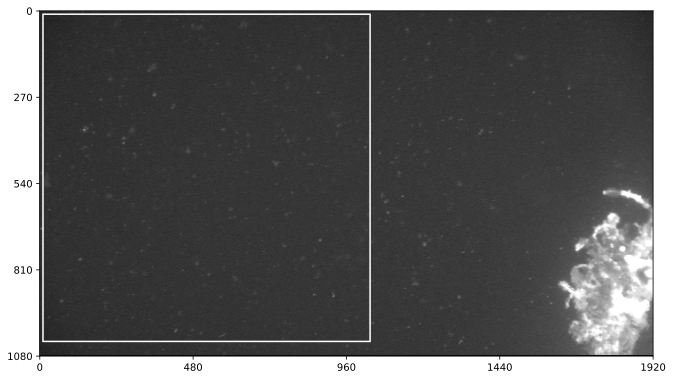

In [11]:
%matplotlib inline
%config InlineBackend.figure_format = 'svg'
import matplotlib.pyplot as plt
import matplotlib.patches as patches
plt.rc('figure', figsize=(11, 11))
fig, ax = plt.subplots()
im1 = ax.imshow(frame)
im1.set_cmap('gray')
plt.yticks(np.arange(0,1081,270))
plt.xticks(np.arange(0,1921,480))
rect = patches.Rectangle((10,10),1024,1024,linewidth=1.5,edgecolor='w',facecolor='none')
ax.add_patch(rect)
plt.show();

## Show the filter that will be used to filter images in the frequency domain
To deal with variations in lighting and high-frequency noise, we filter each subimage using a Butterworth bandpass filter.

In [12]:
def butterworth(d1, d2, n):
    x = np.arange(-1024/2+0.5,1024/2+1-0.5)
    xx, yy = np.meshgrid(x, x)
    d = np.sqrt(xx**2+yy**2)
    bff = (1 - (1./(1 + (d/d1)**(2*n))))*(1/(1 + (d/d2)**(2*n)))
    return bff

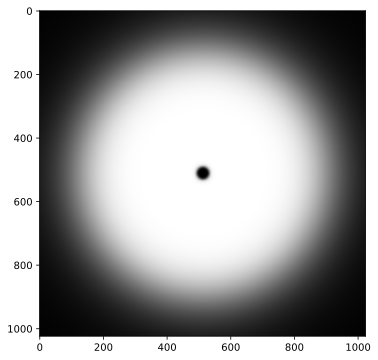

In [13]:
d1 = 20 # low cut wavenumber
d2 = 400 # high cut wavenumber
n = 4
bff = butterworth(d1, d2, n)
plt.rc('figure', figsize=(6, 6))
imgplot = plt.imshow(bff, cmap='gray')

## Define the floc proxy function
The floc proxy is simply the number of pixels in each filtered subimage that have a value greater than 4000.

In [14]:
def frame_filter(frame, d1, d2, n):
    if frame.ndim == 3 and frame.shape[0] == 1:
        I = np.squeeze(frame[0, 0:1024, 0:1024])
    else:
        I = frame[0:1024, 0:1024]
    bff = butterworth(d1, d2, n)
    I_fft = np.fft.fft2(I)
    I_fft_shift = np.fft.fftshift(I_fft)
    I_fft_shift_filt = I_fft_shift*bff # filter with the Butterworth filter
    I_fft_filt = np.fft.ifftshift(I_fft_shift_filt)
    I_filt = np.fft.ifft2(I_fft_filt)
    return I_filt

In [15]:
def calc_floc_proxy(frame, d1, d2, n):
    I_filt = frame_filter(frame, d1, d2, n)
    return np.array([(np.absolute(I_filt)>4000).sum()])

## Show example for one frame

In [16]:
I_filt = frame_filter(frame, d1, d2, n)

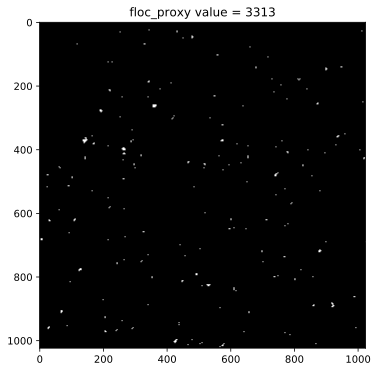

In [17]:
plt.rc('figure', figsize=(6, 6))
imgplot = plt.imshow(np.absolute(I_filt)>4000, cmap='gray')
plt.title('floc_proxy value = %i' % (np.absolute(I_filt)>4000).sum());

## Assemble a new Dask array including our computation using map_blocks

In [18]:
floc_proxy = dsa.map_blocks(calc_floc_proxy, delayed_frame_array, d1, d2, n, dtype='i8', drop_axis=[1,2])
floc_proxy

,Array,Chunk
Bytes,90.48 kB,8 B
Shape,"(11310,)","(1,)"
Count,47125 Tasks,11310 Chunks
Type,int64,numpy.ndarray


## Start a Dask cluster
Use the new Dask extension!

In [19]:
client

Client Scheduler: tcp://10.0.128.108:44357 Dashboard: /user/tjcrone/proxy/8787/status,Cluster Workers: 121 Cores: 121 Memory: 151.25 GB


## Calculate (a subset of) the results

In [20]:
print('Number of images: %i' % len(floc_proxy))
print('Size of dataset (GB): %i' % round(len(floc_proxy)*1080*1920*2/1024/1024/1024))

Number of images: 11310
Size of dataset (GB): 44


In [21]:
interval = 10

In [22]:
%%time
results = floc_proxy[0::interval].compute()

CPU times: user 6.94 s, sys: 340 ms, total: 7.28 s
Wall time: 1min 9s


In [ ]:
from Dask.distributed import Compute
results = Compute(*floc_proxy)

## Load all results

In [23]:
results = np.load('all_results.npy')

In [24]:
len(results)

11310

## Get a timestamp for each frame

In [25]:
import datetime, math
import matplotlib.dates as dates
frame_timestamp = []
for blob_url in blob_urls:
    timestamp = dbcamhd['timestamp'][dbcamhd.blob_url == blob_url].iloc[0]
    for frame_number in frame_numbers:
        timestamp = timestamp + frame_number/29.97
        dt = datetime.datetime.fromtimestamp(timestamp)
        frame_timestamp.append(dates.date2num(dt))

## Plot a two-dimensional multivariate histogram of the results

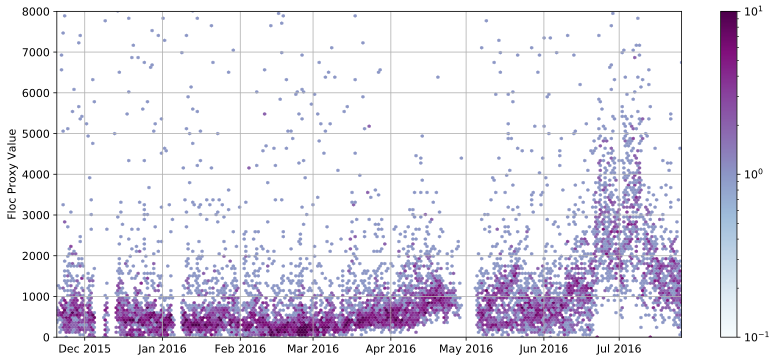

In [26]:
plt.rc('font', size=11)
fig, ax = plt.subplots()
fig.set_size_inches(14, 6)
fig.frameon = False
hb1 = ax.hexbin(frame_timestamp[0::1], results, vmin=0.1, vmax=10, bins='log', linewidths=0.25,
  gridsize=(200, 4000), mincnt=1, cmap=plt.cm.BuPu)
fig.colorbar(hb1)
ax.set_ylim([0, 8000])
ax.set_xlim([frame_timestamp[0],frame_timestamp[-1]])
ax.yaxis.grid(True)
ax.xaxis.grid(True)
months = dates.MonthLocator(interval=1)  # every month
monthsFmt = dates.DateFormatter('%b %Y')
ax.xaxis.set_major_locator(months)
ax.xaxis.set_major_formatter(monthsFmt)
plt.ylabel('Floc Proxy Value');

Starting in mid-June a large "floc event" occurs where the floc proxy values increase on average by about a factor of ten. The cause of this floc event is being investigated.

## References

 - [Pangeo](http://pangeo-data.org/)
 - [PyCamHD](https://github.com/tjcrone/pycamhd)
 - [CamHD Raw Data Archive](https://rawdata.oceanobservatories.org/files/RS03ASHS/PN03B/06-CAMHDA301)
 - [AGU Abstract](https://agu.confex.com/agu/fm16/meetingapp.cgi/Paper/192670)
 - [AGU Poster](https://drive.google.com/open?id=0B-dWW4GM434obGpTM0FZME10Nkk)
 - [Dask](http://dask.pydata.org/en/latest/)